# Clustering End-to-End project
----
In this notebook, we would use CCGeneral.csv dataset, which includes data on bank customers and their behaviour with their credit cards.

* CUST_ID : Identification of Credit Card holder (Categorical) 
* BALANCE : Balance amount left in their account to make purchases 
* BALANCE_FREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated) 
* PURCHASES : Amount of purchases made from account 
* ONEOFF_PURCHASES : Maximum purchase amount done in one-go 
* INSTALLMENTS_PURCHASES : Amount of purchase done in installment 
* CASH_ADVANCE : Cash in advance given by the user 
* PURCHASES_FREQUENCY : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased) 
* ONEOFF_PURCHASES_FREQUENCY : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased) 
* PURCHASES_INSTALLMENTS_FREQUENCY : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done) 
* CASH_ADVANCE_FREQUENCY : How frequently the cash in advance being paid 
* CASH_ADVANCE_TRX : Number of Transactions made with “Cash in Advanced” 
* PURCHASES_TRX : Number of purchase transactions made 
* CREDIT_LIMIT : Limit of Credit Card for user PAYMENTS : Amount of Payment done by user 
* MINIMUM_PAYMENTS : Minimum amount of payments made by user 
* PRC_FULL_PAYMENT : Percent of full payment paid by user 
* TENURE : Tenure of credit card service for user (Repayement period)

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler

## Part One: Data Analysis & Cleaning

In [2]:
try:
    df = pd.read_csv('CCGeneral.csv')
except IOError as e:
    print(e)

df.columns = df.columns.str.lower()
df

,cust_id,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [3]:
df.dtypes

cust_id                              object
balance                             float64
balance_frequency                   float64
purchases                           float64
oneoff_purchases                    float64
installments_purchases              float64
cash_advance                        float64
purchases_frequency                 float64
oneoff_purchases_frequency          float64
purchases_installments_frequency    float64
cash_advance_frequency              float64
cash_advance_trx                      int64
purchases_trx                         int64
credit_limit                        float64
payments                            float64
minimum_payments                    float64
prc_full_payment                    float64
tenure                                int64
dtype: object

In [4]:
df.drop('cust_id', axis=1, inplace=True, errors='ignore')
df.dtypes

balance                             float64
balance_frequency                   float64
purchases                           float64
oneoff_purchases                    float64
installments_purchases              float64
cash_advance                        float64
purchases_frequency                 float64
oneoff_purchases_frequency          float64
purchases_installments_frequency    float64
cash_advance_frequency              float64
cash_advance_trx                      int64
purchases_trx                         int64
credit_limit                        float64
payments                            float64
minimum_payments                    float64
prc_full_payment                    float64
tenure                                int64
dtype: object

In [5]:
df.describe()

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


In [6]:
df.isnull().sum()

balance                               0
balance_frequency                     0
purchases                             0
oneoff_purchases                      0
installments_purchases                0
cash_advance                          0
purchases_frequency                   0
oneoff_purchases_frequency            0
purchases_installments_frequency      0
cash_advance_frequency                0
cash_advance_trx                      0
purchases_trx                         0
credit_limit                          1
payments                              0
minimum_payments                    313
prc_full_payment                      0
tenure                                0
dtype: int64

In [7]:
avg_min_pay = df.minimum_payments.mean()
df.minimum_payments = df.minimum_payments.fillna(avg_min_pay)
df.isnull().sum()

balance                             0
balance_frequency                   0
purchases                           0
oneoff_purchases                    0
installments_purchases              0
cash_advance                        0
purchases_frequency                 0
oneoff_purchases_frequency          0
purchases_installments_frequency    0
cash_advance_frequency              0
cash_advance_trx                    0
purchases_trx                       0
credit_limit                        1
payments                            0
minimum_payments                    0
prc_full_payment                    0
tenure                              0
dtype: int64

In [8]:
df = df.dropna()
df.isnull().sum()

balance                             0
balance_frequency                   0
purchases                           0
oneoff_purchases                    0
installments_purchases              0
cash_advance                        0
purchases_frequency                 0
oneoff_purchases_frequency          0
purchases_installments_frequency    0
cash_advance_frequency              0
cash_advance_trx                    0
purchases_trx                       0
credit_limit                        0
payments                            0
minimum_payments                    0
prc_full_payment                    0
tenure                              0
dtype: int64

In [9]:
corr_matrix = df.corr()
corr_matrix

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
balance,1.000000,0.322335,0.181230,0.164326,0.126437,0.496679,-0.078054,0.073114,-0.063267,0.449246,0.385139,0.154297,0.531283,0.322769,0.394266,-0.319018,0.072421
balance_frequency,0.322335,1.000000,0.133586,0.104257,0.124204,0.099312,0.229440,0.202295,0.175869,0.192022,0.141516,0.189527,0.095843,0.064842,0.114185,-0.095308,0.118566
purchases,0.181230,0.133586,1.000000,0.916844,0.679889,-0.051495,0.392991,0.498413,0.315537,-0.120137,-0.067194,0.689552,0.356963,0.603252,0.093497,0.180356,0.086155
oneoff_purchases,0.164326,0.104257,0.916844,1.000000,0.330610,-0.031341,0.264913,0.524881,0.127699,-0.082622,-0.046226,0.545514,0.319724,0.567283,0.048584,0.132745,0.064047
installments_purchases,0.126437,0.124204,0.679889,0.330610,1.000000,-0.064264,0.442398,0.214016,0.511334,-0.132312,-0.074017,0.628097,0.256499,0.384066,0.131671,0.182548,0.086016
cash_advance,0.496679,0.099312,-0.051495,-0.031341,-0.064264,1.000000,-0.215579,-0.086786,-0.177118,0.628535,0.656493,-0.075877,0.303985,0.453226,0.139210,-0.152961,-0.068552
purchases_frequency,-0.078054,0.229440,0.392991,0.264913,0.442398,-0.215579,1.000000,0.501305,0.862921,-0.308483,-0.203541,0.568408,0.119788,0.103393,0.002926,0.305761,0.061006
oneoff_purchases_frequency,0.073114,0.202295,0.498413,0.524881,0.214016,-0.086786,0.501305,1.000000,0.142270,-0.111707,-0.069116,0.544849,0.295038,0.243503,-0.029991,0.157497,0.082234
purchases_installments_frequency,-0.063267,0.175869,0.315537,0.127699,0.511334,-0.177118,0.862921,0.142270,1.000000,-0.262955,-0.169250,0.529949,0.060755,0.085496,0.029554,0.250049,0.072926
cash_advance_frequency,0.449246,0.192022,-0.120137,-0.082622,-0.132312,0.628535,-0.308483,-0.111707,-0.262955,1.000000,0.799573,-0.131161,0.132616,0.183206,0.097906,-0.249768,-0.133427


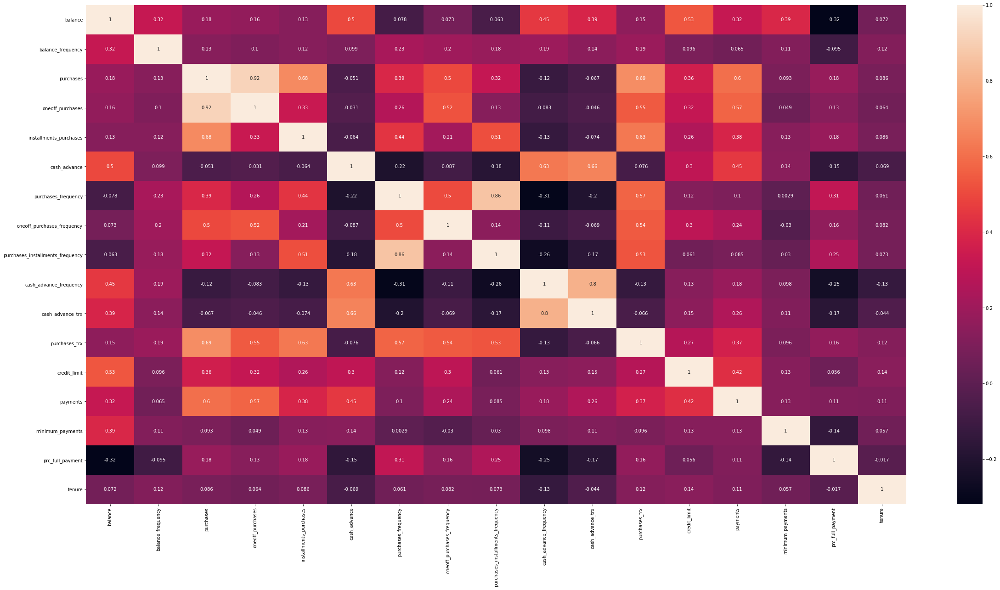

In [10]:
plt.figure(figsize=(40, 20))
heatmap = sns.heatmap(corr_matrix, annot=True)

<Figure size 2880x1440 with 0 Axes>

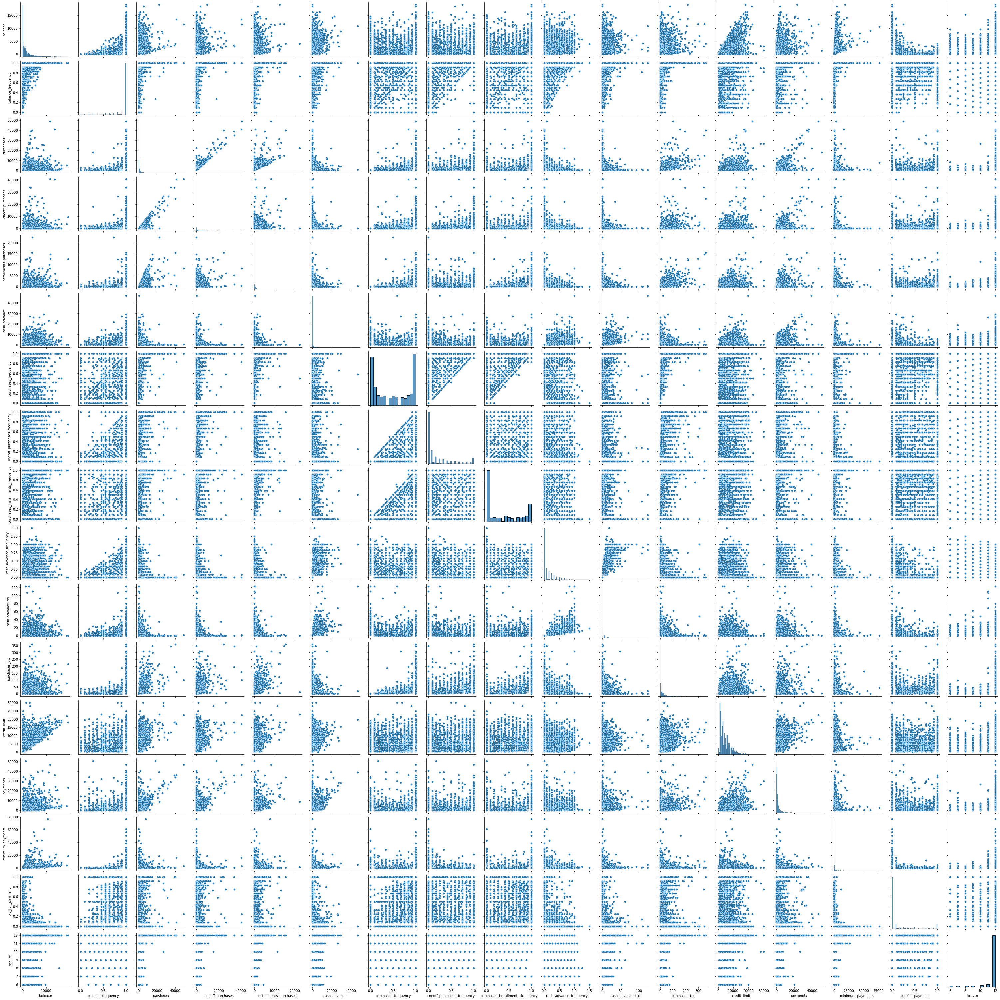

In [11]:
plt.figure(figsize=(40, 20))
sns.pairplot(df)

In [12]:
Sc = StandardScaler()
df_scaled = Sc.fit_transform(df)

## Part Two: Elbow-method to get optimum K
---
We will apply KMeans with different K-values & calculating the inertia each time, and plot them. Hopefully, we can see an "elbow" and get best value of k.

Notice that real-life data isn't alway perfect for methods, and you don't necessarily have to see an elbow in the plot, so you compromise.

In [13]:
wcss_values = []
for i in range(1, 11):
    model = KMeans(n_clusters=i, init='k-means++', random_state=5)
    model = model.fit(df_scaled)
    wcss_values.append(model.inertia_)

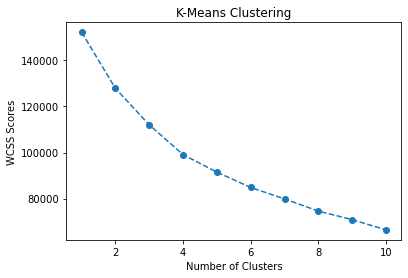

In [14]:
plt.plot(range(1, 11), wcss_values, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS Scores')
plt.title('K-Means Clustering')
plt.show()

## Part Three: Build your Model & Get Labels

In [15]:
model = KMeans(n_clusters=4, init='k-means++', random_state=5)
model = model.fit(df_scaled)
labels = model.labels_
assert len(labels) == len(df)
print(len(labels))

8949


In [16]:
# I added a new column called segment in the data, and set it to values.
df['segment'] = labels
df

C:\Users\RADWAK~1\AppData\Local\Temp/ipykernel_13152/3482294215.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['segment'] = labels


,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure,segment
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,2
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,3
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,864.206542,0.000000,12,1
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,3
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,864.206542,0.000000,6,3
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,3
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,1


In [17]:
# this way we can see the average values of each column grouped by the segment label
df.groupby('segment').mean()

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
segment,,,,,,,,,,,,,,,,,
0,3551.153761,0.986879,7681.620098,5095.878826,2587.208264,653.638891,0.946418,0.739031,0.788060,0.071290,2.085575,89.359413,9696.943765,7288.739497,1976.815179,0.286707,11.951100
1,1012.001428,0.790028,270.041384,209.906657,60.401816,595.862209,0.170189,0.086303,0.080598,0.114820,2.125786,2.904151,3277.397065,974.747974,586.445109,0.078020,11.447799
2,4602.462714,0.968415,501.896219,320.373681,181.607404,4520.724309,0.287731,0.138934,0.185516,0.484526,14.284641,7.661102,7546.957050,3481.145990,2008.251157,0.034859,11.387312
3,894.907458,0.934734,1236.178934,593.974874,642.478274,210.570626,0.885165,0.297070,0.711842,0.042573,0.790021,22.091773,4213.207678,1332.194205,650.167072,0.269258,11.594595


## Part Four: Plot data with label between different features
---
Notice that since we have data more than 2D, we can't plot them once.
But what we can do is plotting them between each two features as following...

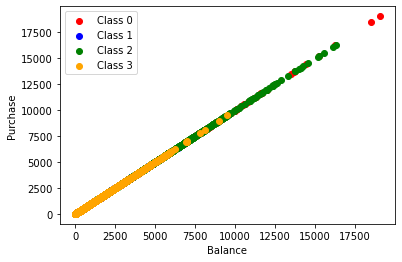

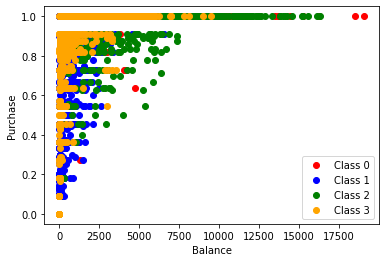

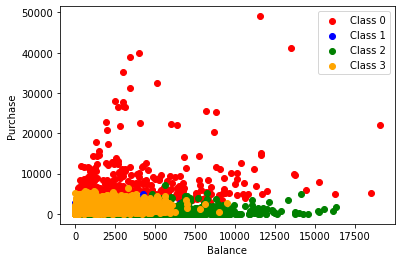

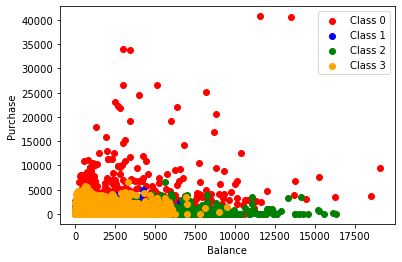

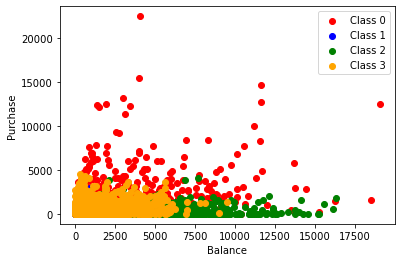

...

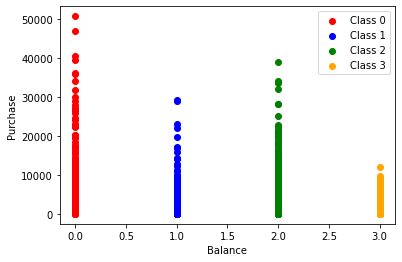

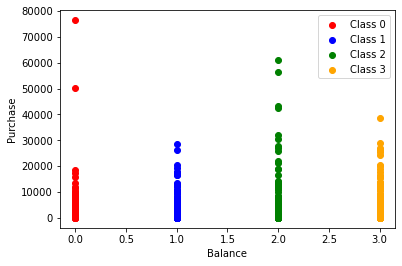

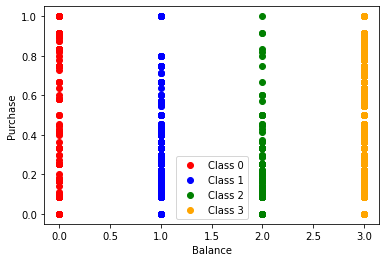

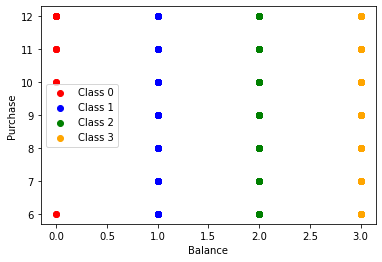

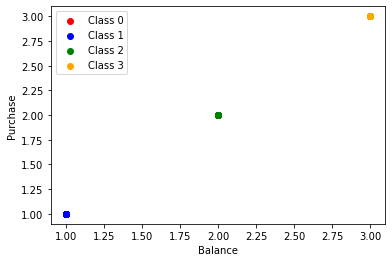

In [18]:
for x in df.columns:
    X = df[x]
    for y in df.columns:
        Y = df[y]
        plt.scatter(X[df.segment == 0], Y[df.segment == 0], color='red', label='Class 0')
        plt.scatter(X[df.segment == 1], Y[df.segment == 1], color='blue', label='Class 1')
        plt.scatter(X[df.segment == 2], Y[df.segment == 2], color='green', label='Class 2')
        plt.scatter(X[df.segment == 3], Y[df.segment == 3], color='orange', label='Class 3')
        plt.xlabel('Balance')
        plt.ylabel('Purchase')
        plt.legend()
        plt.show()

### Calculate Silhoette Score of this Model

In [19]:
df = df.drop('segment', axis=1, errors='ignore')
sil_score = silhouette_score(df, labels)
print("Silhouette Score is: %.2f" % sil_score)

Silhouette Score is: 0.04


## Part Five: Dimensions Reduction
---
We will use PCA to reduce dimensions from 18 to ... ?
Let's use elbow-method again to choose a number of dimensions.

In [20]:
pca = PCA()
pca = pca.fit(df_scaled)
variances = pca.explained_variance_ratio_.cumsum()
variances

array([0.27287777, 0.47590443, 0.56381437, 0.63862457, 0.70125634,
       0.75875978, 0.80763109, 0.85019637, 0.88850168, 0.91930214,
       0.94302235, 0.96075947, 0.97502497, 0.98719854, 0.99732875,
       0.99999931, 1.        ])

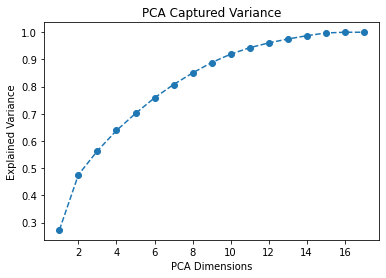

In [21]:
plt.plot(range(1, 18), variances, marker='o', linestyle='--')
plt.xlabel('PCA Dimensions')
plt.ylabel('Explained Variance')
plt.title('PCA Captured Variance')
plt.show()

## Part Six: Use final PCA model to get new axes
---
Again, there is no clear elbow here, so we will take 6 and go with it

In [22]:
pca = PCA(n_components=6)
pca = pca.fit(df_scaled)

In [23]:
df_pca = pca.transform(df_scaled)
print(df_scaled.shape)
print(df_pca.shape)

(8949, 17)
(8949, 6)


## Part Seven: Rebuild your KMeans model
---
I will do as I did above, first checking whether there is a clear elbow for K-value. Then build the model & fit it.

In [24]:
wcss_values = []
for i in range(1, 11):
    model_after_pca = KMeans(n_clusters=i, init='k-means++', random_state=3)
    model_after_pca = model_after_pca.fit(df_pca)
    wcss_values.append(model_after_pca.inertia_)

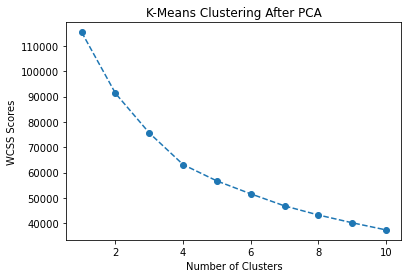

In [25]:
plt.plot(range(1, 11), wcss_values, marker='o', linestyle='--')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS Scores')
plt.title('K-Means Clustering After PCA')
plt.show()

In [26]:
model_pca = KMeans(n_clusters=4, init='k-means++', random_state=5)
model_pca = model_pca.fit(df_pca)
labels = model_pca.labels_
assert len(labels) == len(df_scaled)
print(len(labels))
df['segment'] = labels
df

8949


,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure,segment
0,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12,1
1,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12,2
2,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12,3
3,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,864.206542,0.000000,12,1
4,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6,3
8946,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,864.206542,0.000000,6,3
8947,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6,3
8948,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6,1


In [27]:
df.groupby('segment').mean()

,balance,balance_frequency,purchases,oneoff_purchases,installments_purchases,cash_advance,purchases_frequency,oneoff_purchases_frequency,purchases_installments_frequency,cash_advance_frequency,cash_advance_trx,purchases_trx,credit_limit,payments,minimum_payments,prc_full_payment,tenure
segment,,,,,,,,,,,,,,,,,
0,3754.225312,0.986863,8136.215913,5494.251499,2643.599292,740.233308,0.942783,0.746631,0.772207,0.076951,2.324251,89.373297,10022.752044,7817.958302,2127.662624,0.288931,11.945504
1,1006.892252,0.787145,283.904932,218.582421,65.583688,566.249924,0.185252,0.089993,0.091285,0.109811,2.009102,3.135793,3315.560476,956.864917,609.242719,0.080992,11.423616
2,4507.776011,0.968315,473.395993,296.755249,176.723876,4483.503071,0.279020,0.134396,0.179911,0.484531,14.229763,7.399019,7399.022523,3466.761688,1941.228954,0.036368,11.401472
3,916.273088,0.942693,1293.155789,617.624457,675.811624,213.695744,0.895065,0.305948,0.724715,0.043160,0.805404,23.393139,4254.924181,1370.046238,638.460015,0.272009,11.629933


### What if we calculated Silhouette Score on same data with new labels?

In [28]:
df = df.drop('segment', axis=1, errors='ignore')
sil_score = silhouette_score(df, labels)
print("Silhouette Score is: %.2f" % sil_score)

Silhouette Score is: 0.05


In [29]:
new_df = pd.DataFrame(df_pca, columns=['PCA Component 1', 'PCA Component 2', 'PCA Component 3', 'PCA Component 4', 'PCA Component 5', 'PCA Component 6'])
new_df['labels'] = labels
new_df

,PCA Component 1,PCA Component 2,PCA Component 3,PCA Component 4,PCA Component 5,PCA Component 6,labels
0,-1.682360,-1.076720,0.490160,0.664694,0.018464,0.052407,1
1,-1.138967,2.506112,0.602491,-0.120915,0.611466,-1.131525,2
2,0.969377,-0.383427,0.103995,1.207674,-2.173293,-0.229391,3
3,-0.873812,0.042929,1.461940,1.150399,0.295738,-0.121248,1
4,-1.599682,-0.688769,0.367029,0.988980,-0.487534,0.075215,1
...,...,...,...,...,...,...,...
8944,-0.359268,-2.015733,-1.002524,-2.729321,0.255753,2.678073,3
8945,-0.564020,-1.638742,-1.297119,-1.862009,0.170028,3.386896,3
8946,-0.925785,-1.810490,-0.481547,-2.282564,0.372032,2.981586,3
8947,-2.336211,-0.657802,0.968613,-1.865871,0.054580,3.180394,1


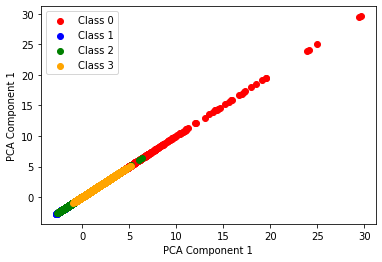

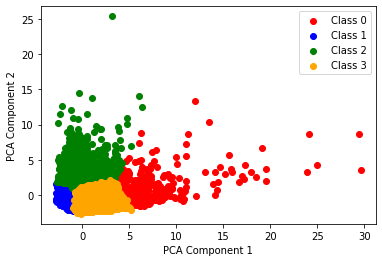

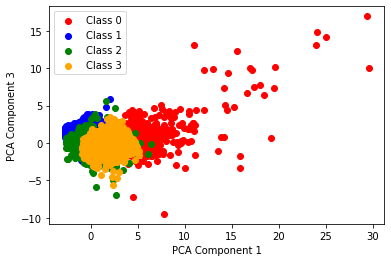

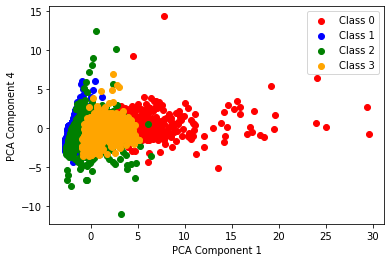

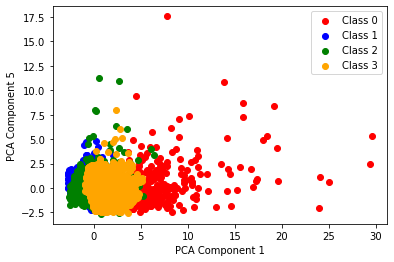

...

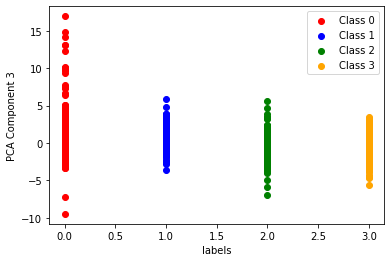

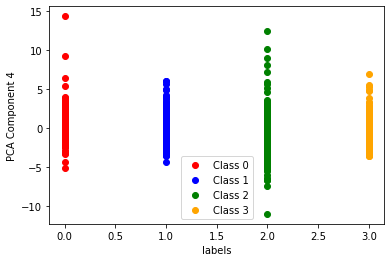

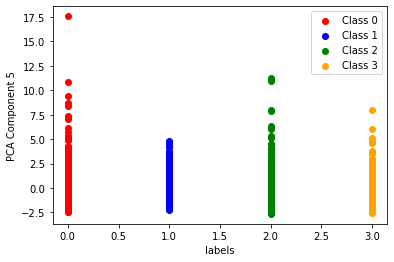

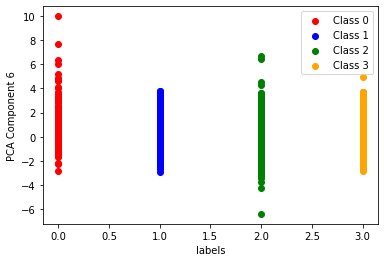

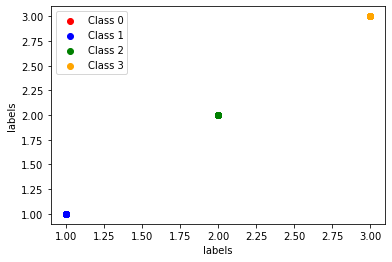

In [30]:
for x in new_df.columns:
    X = new_df[x]
    for y in new_df.columns:
        Y = new_df[y]
        plt.scatter(X[new_df.labels == 0], Y[new_df.labels == 0], color='red', label='Class 0')
        plt.scatter(X[new_df.labels == 1], Y[new_df.labels == 1], color='blue', label='Class 1')
        plt.scatter(X[new_df.labels == 2], Y[new_df.labels == 2], color='green', label='Class 2')
        plt.scatter(X[new_df.labels == 3], Y[new_df.labels == 3], color='orange', label='Class 3')
        plt.xlabel(x)
        plt.ylabel(y)
        plt.legend()
        plt.show()

### Calculate Silhouette Score

In [31]:
sil_score = silhouette_score(new_df, labels)
print("Silhouette Score is: %.2f" % sil_score)

Silhouette Score is: 0.34
